**Set the Colab GPU**

Go to Edit > Notebook settings as the following:

Click on “Notebook settings” and select “GPU” from Hardware *accelerator*. That's it.

**Connect Colab with Google Drive**

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!python -m pip install pyyaml==5.1

# Properly install detectron2.
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

# Note: This is a faster way to install detectron2 in Colab, but it does not include all functionalities
#(e.g. compiled operators).
#(Please do not install twice in both ways)
#!git clone 'https://github.com/facebookresearch/detectron2'
#dist = distutils.core.run_setup("./detectron2/setup.py")
#!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
#sys.path.insert(0, os.path.abspath('./detectron2'))

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.2/274.2 kB 2.2 MB/s eta 0:00:00
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.
  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-rh7st9vx
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-rh7st9vx
  Resolved https://github.com/facebookresearch/detectron2.git to commit 3eef7a58ad5bf78c2dadd184e94fc65f31804196
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50

In [3]:
import detectron2

# Setup detectron2 logger
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common detectron2 utilities
#https://github.com/facebookresearch/detectron2/blob/main/MODEL_ZOO.md
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

# import some common libraries
import numpy as np
import torch, os, json, cv2, random
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow




**Balloon Dataset**

In [29]:
# https://github.com/matterport/Mask_RCNN/releases/download/v2.1/balloon_dataset.zip

balloonData_path = '/content/drive/My Drive/Colab Notebooks/balloon/balloon/'

In [30]:
# if your dataset is in COCO format, then write the following three lines:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train", {}, "json_annotation_train.json", "path/to/image/dir")
register_coco_instances("my_dataset_val", {}, "json_annotation_val.json", "path/to/image/dir")

AssertionError: Dataset 'my_dataset_train' is already registered!

In [31]:
#function to parse and prepare bolloon dataset into detectron2's standard format

from detectron2.structures import BoxMode

def get_balloon_dicts(balloonData_path):
    json_file = os.path.join(balloonData_path, "via_region_data.json")
    with open(json_file) as f:
        imgs_anns = json.load(f)

    dataset_dicts = []
    for idx, v in enumerate(imgs_anns.values()):
        record = {}

        filename = os.path.join(balloonData_path, v["filename"])
        height, width = cv2.imread(filename).shape[:2]

        record["file_name"] = filename
        record["image_id"] = idx
        record["height"] = height
        record["width"] = width

        annos = v["regions"]
        objs = []
        for _, anno in annos.items():
            assert not anno["region_attributes"]
            anno = anno["shape_attributes"]
            px = anno["all_points_x"]
            py = anno["all_points_y"]
            poly = [(x + 0.5, y + 0.5) for x, y in zip(px, py)]
            poly = [p for x in poly for p in x]

            obj = {
                "bbox": [np.min(px), np.min(py), np.max(px), np.max(py)],
                "bbox_mode": BoxMode.XYXY_ABS,
                "segmentation": [poly],
                "category_id": 0,
            }
            objs.append(obj)

        record["annotations"] = objs
        dataset_dicts.append(record)
    return dataset_dicts

In [32]:
#Register the balloon dataset to detectron2

from detectron2.data import DatasetCatalog

for d in ["train", "val"]:
    DatasetCatalog.register("balloon_" + d, lambda d=d: get_balloon_dicts(balloonData_path + d))
    MetadataCatalog.get("balloon_" + d).set(thing_classes=["balloon"])

balloon_metadata = MetadataCatalog.get("balloon_train")

AssertionError: Dataset 'balloon_train' is already registered!

In [34]:
import os

json_file_path = os.path.join(balloonData_path, "train/via_region_data.json")
if os.path.exists(json_file_path):
    # Proceed with opening the file
    with open(json_file_path) as f:
        imgs_anns = json.load(f)
else:
    print(f"Error: File '{json_file_path}' not found.")


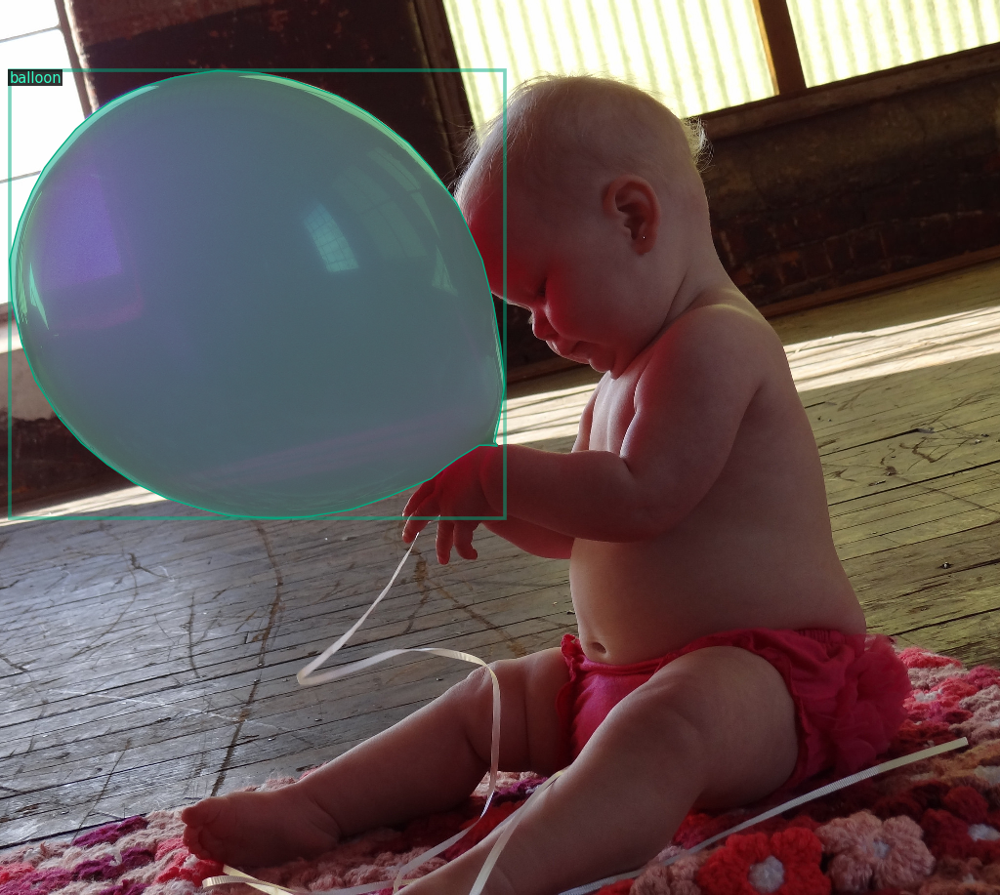

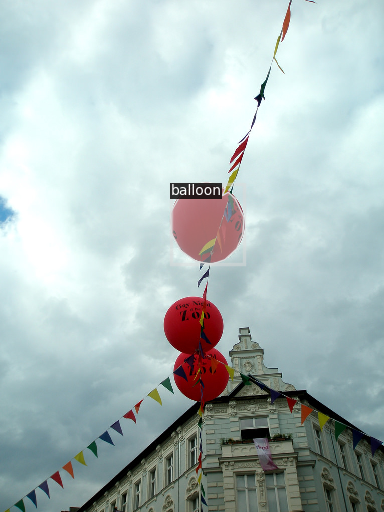

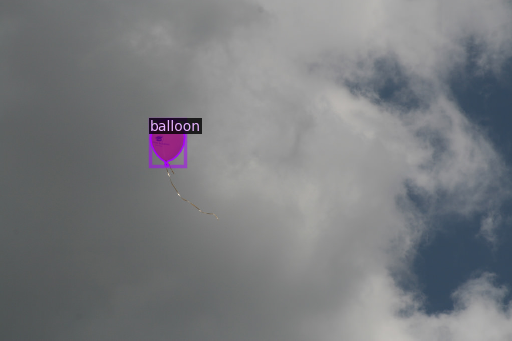

In [35]:
dataset_dicts = get_balloon_dicts(balloonData_path + "train")
for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=balloon_metadata, scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])

# Object Detection with Custom Dataset using Faster R-CNN

In [36]:
#https://github.com/facebookresearch/detectron2/tree/main/configs/COCO-Detection

from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("balloon_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml")  # initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.MAX_ITER = 500
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # faster, and good enough for this toy dataset
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # only has one class (ballon)

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[05/02 04:09:45 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_f6e8b1.pkl: 243MB [00:01, 125MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[05/02 04:09:50 d2.engine.train_loop]: Starting training from iteration 0


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/local/lib/python3.10/dist-packages/torch/functional.py:507: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3549.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[05/02 04:10:09 d2.utils.events]:  eta: 0:04:56  iter: 19  total_loss: 1.329  loss_cls: 0.6273  loss_box_reg: 0.6345  loss_rpn_cls: 0.03433  loss_rpn_loc: 0.009255    time: 0.6704  last_time: 0.6905  data_time: 0.0438  last_data_time: 0.0059   lr: 9.7405e-06  max_mem: 3329M
[05/02 04:10:25 d2.utils.events]:  eta: 0:04:51  iter: 39  total_loss: 1.356  loss_cls: 0.5785  loss_box_reg: 0.7053  loss_rpn_cls: 0.03556  loss_rpn_loc: 0.008551    time: 0.6680  last_time: 0.6363  data_time: 0.0233  last_data_time: 0.0125   lr: 1.9731e-05  max_mem: 3331M
[05/02 04:10:38 d2.utils.events]:  eta: 0:04:47  iter: 59  total_loss: 1.051  loss_cls: 0.4794  loss_box_reg: 0.5426  loss_rpn_cls: 0.0306  loss_rpn_loc: 0.006686    time: 0.6668  last_time: 0.6606  data_time: 0.0109  last_data_time: 0.0073   lr: 2.972e-05  max_mem: 3331M
[05/02 04:10:51 d2.utils.events]:  eta: 0:04:29  iter: 79  total_loss: 1.082  loss_cls: 0.4003  loss_box_reg: 0.6035  loss_rpn_cls: 0.02334  loss_rpn_loc: 0.01024    time: 0.657

In [37]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 4044), started 0:09:27 ago. (Use '!kill 4044' to kill it.)

<IPython.core.display.Javascript object>

# Inference & evaluation using the trained model

In [38]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set the testing threshold for this model
cfg.DATASETS.TEST = ("balloon_val", )
predictor = DefaultPredictor(cfg)

[05/02 04:16:23 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


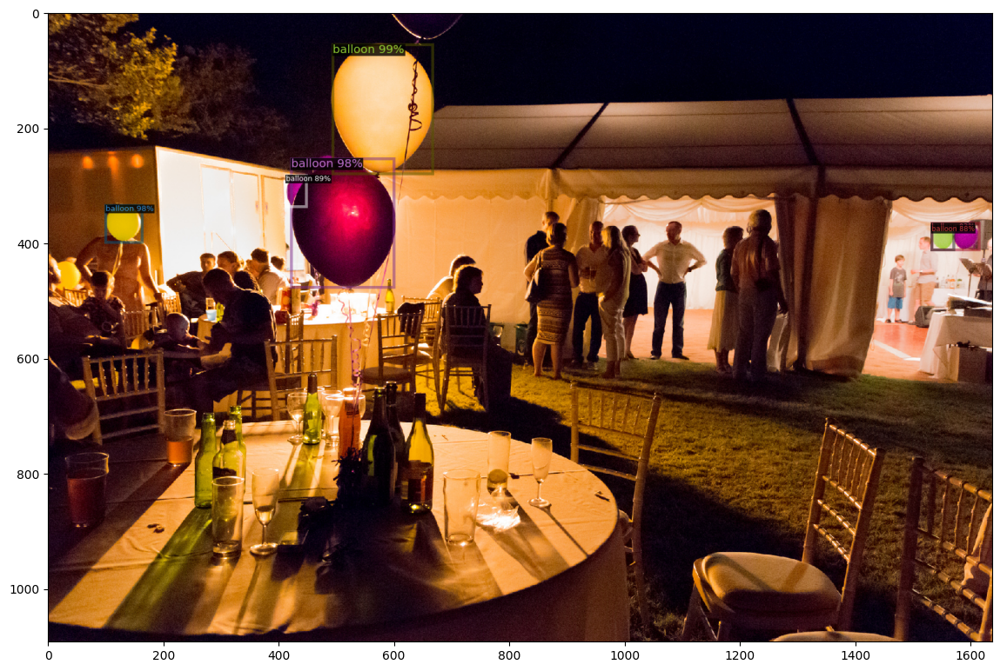

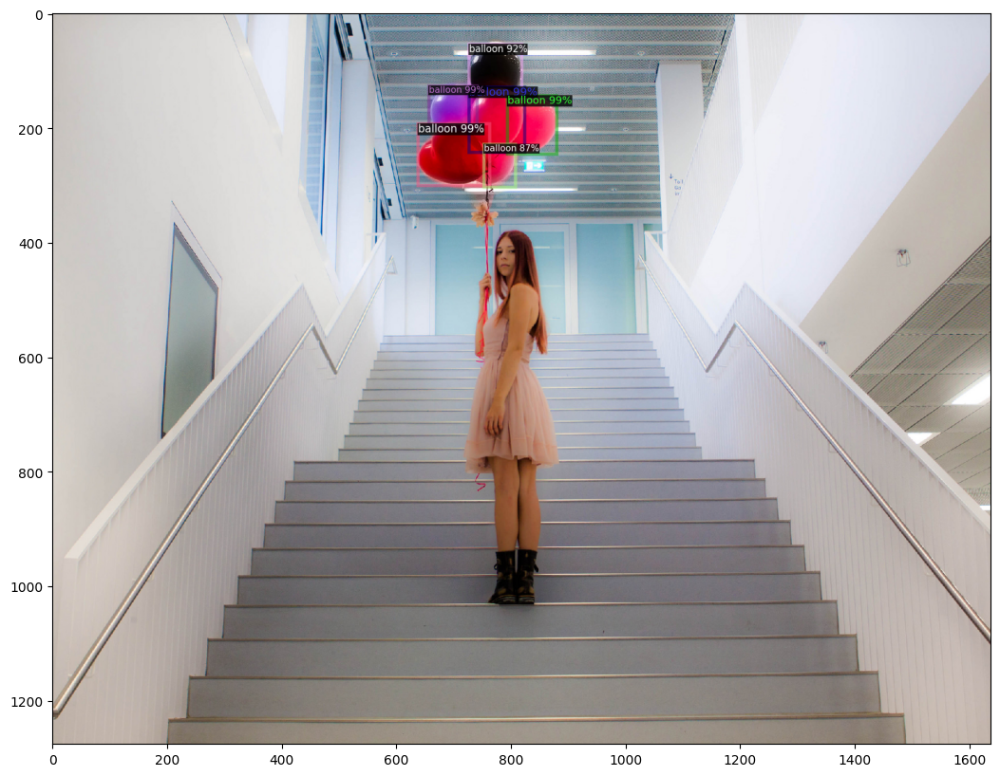

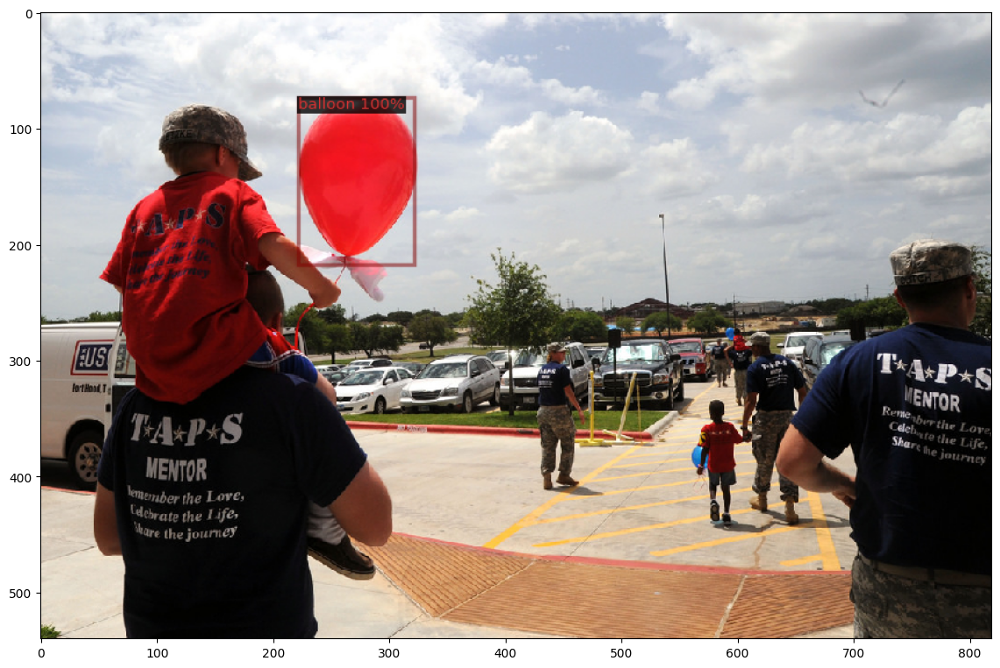

In [39]:

dataset_dicts = get_balloon_dicts(balloonData_path + "val")
for d in random.sample(dataset_dicts, 3):
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1], metadata=balloon_metadata, scale=0.8)
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    plt.figure(figsize = (14, 10))
    plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
    plt.show()

 **Performance Metric**

 Evaluate the performance of Trained Faster RCNN using Average Precision (AP) metric implemented in COCO API.

In [40]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

evaluator = COCOEvaluator("balloon_val", ("bbox",), False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "balloon_val")

print(inference_on_dataset(trainer.model, val_loader, evaluator))

[05/02 04:16:51 d2.evaluation.coco_evaluation]: Trying to convert 'balloon_val' to COCO format ...
[05/02 04:16:51 d2.data.datasets.coco]: Converting annotations of dataset 'balloon_val' to COCO format ...)
[05/02 04:16:52 d2.data.datasets.coco]: Converting dataset dicts into COCO format
[05/02 04:16:52 d2.data.datasets.coco]: Conversion finished, #images: 13, #annotations: 50
[05/02 04:16:52 d2.data.datasets.coco]: Caching COCO format annotations at './output/balloon_val_coco_format.json' ...
[05/02 04:16:52 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
|  balloon   | 50           |
|            |              |
[05/02 04:16:52 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[05/02 04:16:52 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[0

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/02 04:16:55 d2.evaluation.evaluator]: Inference done 11/13. Dataloading: 0.0016 s/iter. Inference: 0.1544 s/iter. Eval: 0.0003 s/iter. Total: 0.1562 s/iter. ETA=0:00:00
[05/02 04:16:55 d2.evaluation.evaluator]: Total inference time: 0:00:01.309247 (0.163656 s / iter per device, on 1 devices)
[05/02 04:16:55 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:01 (0.151549 s / iter per device, on 1 devices)
[05/02 04:16:55 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[05/02 04:16:55 d2.evaluation.coco_evaluation]: Saving results to ./output/coco_instances_results.json
[05/02 04:16:55 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[05/02 04:16:55 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[05/02 04:16:55 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.01 seconds.
[05/02 04:16:55 d2.evaluation.

'AP' stands for "Average Precision," which is a common metric for evaluating object detection performance. It measures the precision and recall trade-off across different confidence score thresholds.

'AP50' represents the Average Precision with IoU (Intersection over Union) threshold of 0.5. It measures the precision and recall at IoU = 0.5, which is a commonly used threshold for detection evaluation.

'AP75' is the Average Precision at IoU threshold of 0.75. It measures the precision and recall at IoU = 0.75, which is a stricter evaluation threshold.

'APs', 'APm', and 'APl' represent the Average Precision for small, medium, and large objects, respectively. These metrics evaluate the detection performance based on the size of the objects in the dataset.